# Liquid Drop

```
Copyright (C) 2021

Code by Leopoldo Sarra and Florian Marquardt
Max Planck Institute for the Science of Light, Erlangen, Germany
http://www.mpl.mpg.de

This work is licensed under the Creative Commons Attribution 4.0 International License. To view a copy of this license, visit http://creativecommons.org/licenses/by/4.0/ or send a letter to Creative Commons, PO Box 1866, Mountain View, CA 94042, USA.

If you find this code useful in your work, please cite our article
"Renormalized Mutual Information for Artificial Scientific Discovery", Leopoldo Sarra, Andrea Aiello, Florian Marquardt, arXiv:2005.01912

available on

https://arxiv.org/abs/2005.01912
```


We extract a two-dimensional feature given $N=60$ particles in a 2d space (two coordinates per particles).

The particles are constrained in a potential of elliptical shape with random orientation and deformation and interact one-another through a Lennard-Jones kind of interraction.

We compare different possible features

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import rmi.neuralnets as nn
import rmi.estimation as inf
import rmi.features as f

import rmi.examples.lennardjones as lj
from rmi.pca import pca as PCA

from tqdm import tqdm, trange

%load_ext line_profiler
%load_ext autoreload
%autoreload 2

## Load a dataset

The dataset should be generated in advance (for example using the code in the scripts folder).
Please note that thermalization can be quite slow, and thermalization time could be switched off to reduce the dataset generation time (in this case particles would be uncorrelated).

In [3]:
DATASET = "liquid-drop-60-final"
samples, water, interactions = lj.load_dataset(DATASET)

N_samples = len(samples)
n_in = np.shape(samples)[1]
print("Training dataset: %d samples" % N_samples)


def get_batch(batchsize):
    """Function to sample from the dataset.
    Makes use of the global variable samples
    """
    # Samples are shuffled
    random_indices = np.random.choice(np.arange(N_samples),size=batchsize)
    return samples[random_indices], None, random_indices


Training dataset: 1000000 samples


In [4]:
particles = np.load("datasets/PARTICLES_"+DATASET+".npy", allow_pickle=True)

 Drop #000: dr=0.49, th=3.04



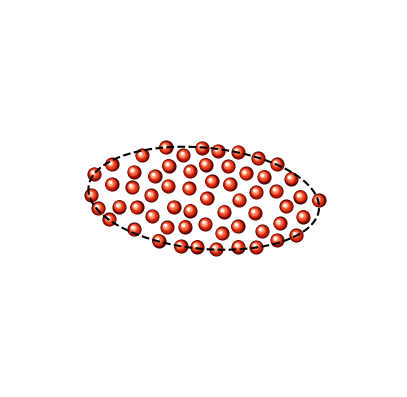

 Drop #001: dr=0.34, th=0.24



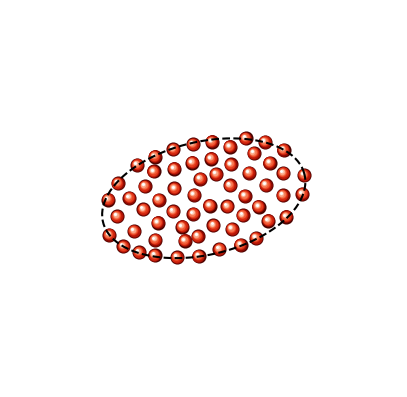

 Drop #002: dr=0.25, th=1.13



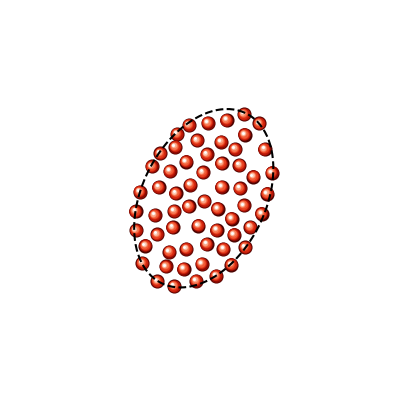

In [5]:
N_test = 200
N_particles = int(n_in/2)
x_batch = samples[0:N_test]

prt =np.zeros([N_test, N_particles, 2])
prt[...,0] = x_batch[:,:N_particles]
prt[...,1] = x_batch[:,N_particles:]

for i in range(3):
    print(" Drop #{:03}: dr={:.2f}, th={:.2f}\n".format(i,water.deltaR.flatten()[i],water.theta.flatten()[i] ))
    lj.plot_drop(i,prt,water,interactions,show3d=True,save_file="figures/lj_"+str(i))

## Feature comparison

In [6]:
# Dictionary where we save the values of RMI of the different features
# for comparison
calculated_rmis = {}

### Handcrafted features

In [7]:
# Calculate handcrafted features
feature_var = lj.variance(samples)  # x^2,  y^2
feature_hc = lj.handcrafted_feature(samples) # x^2, xy

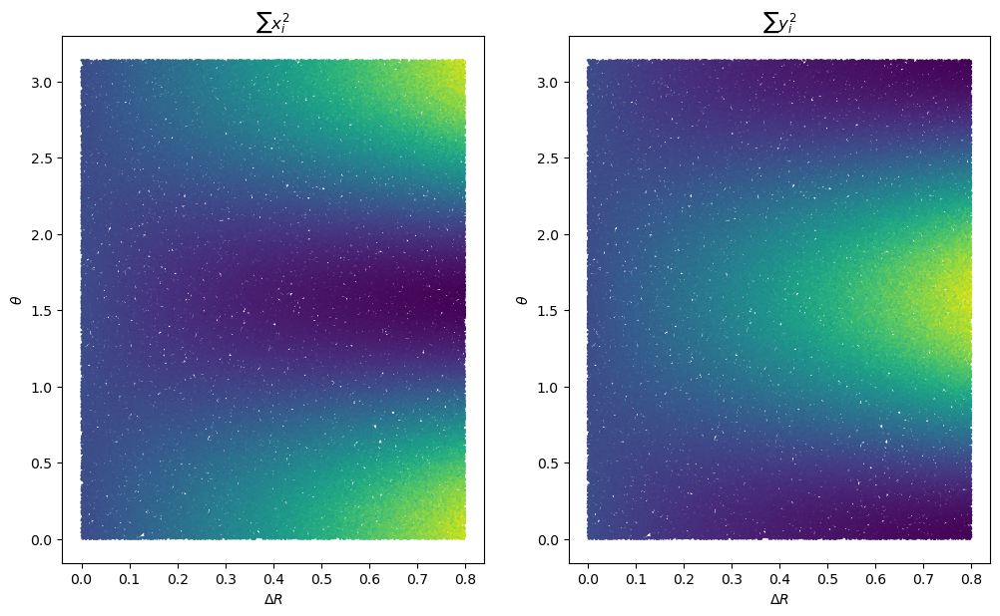

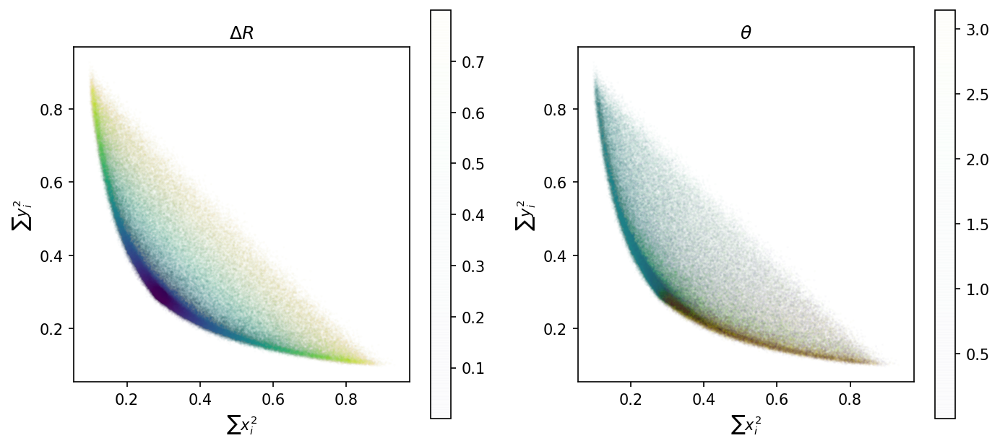

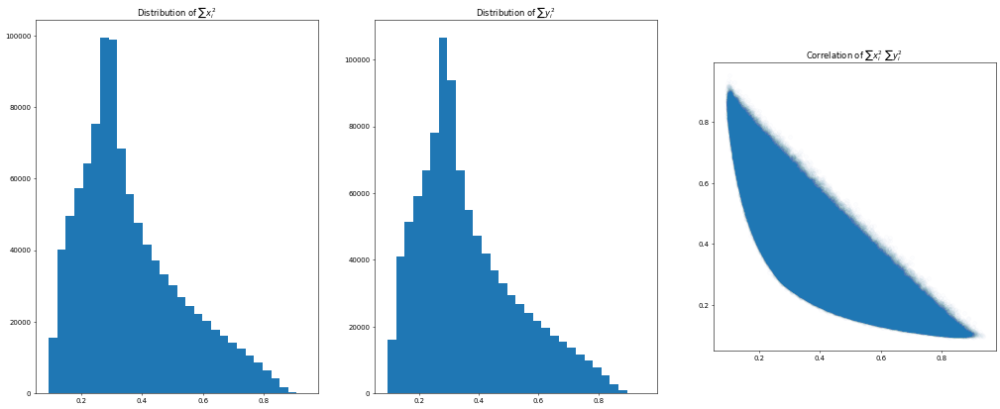

In [7]:
labels = ["$\sum x_i^2$", r"$\sum y_i^2$"]
lj.plot_pars_feature(feature_var[0], water.deltaR, water.theta, labels)
lj.plot_feature_pars(feature_var[0], water.deltaR, water.theta, labels)
lj.plot_feature_hists(feature_var[0], labels)
calculated_rmis["var"] = inf.RenormalizedMutualInformation(*feature_var)

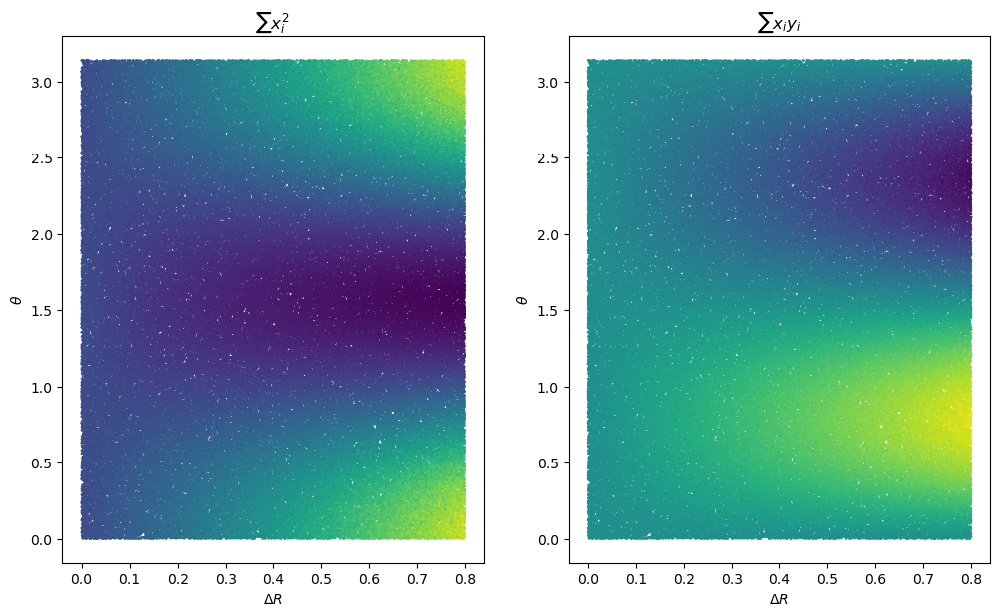

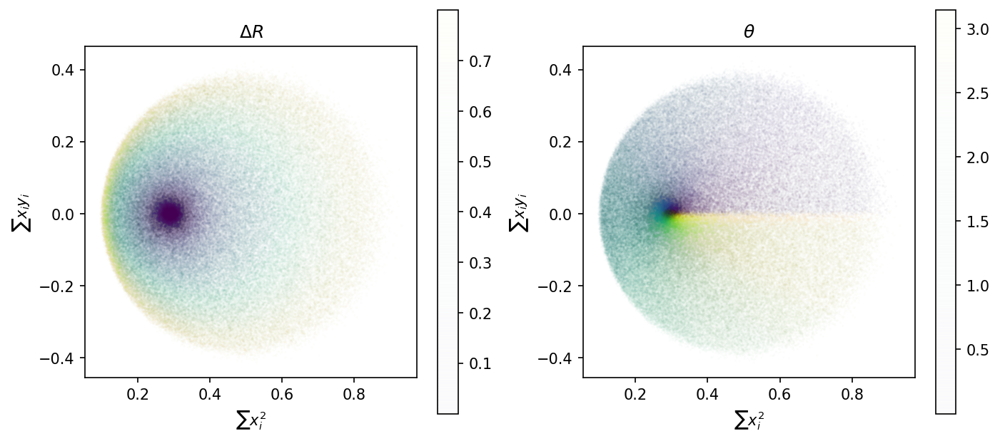

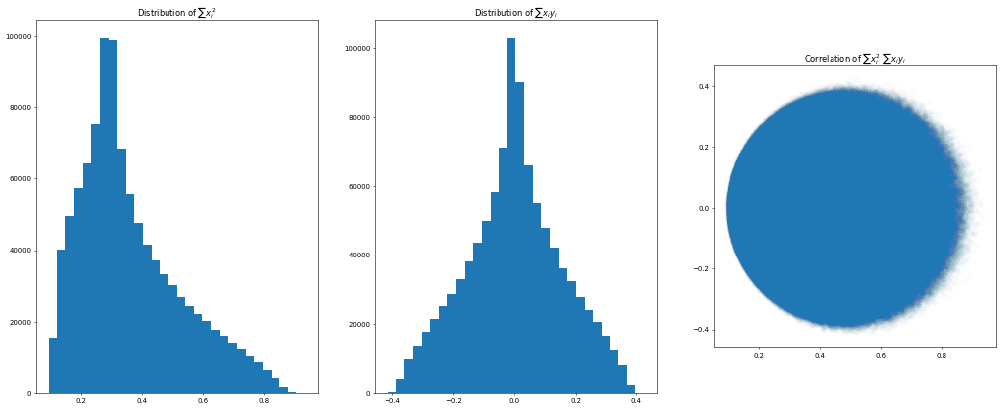

In [8]:
labels = ["$\sum x_i^2$", r"$\sum x_i y_i$"]
lj.plot_pars_feature(feature_hc[0], water.deltaR, water.theta, labels)
lj.plot_feature_pars(feature_hc[0], water.deltaR, water.theta, labels)
lj.plot_feature_hists(feature_hc[0], labels)
calculated_rmis["hc"] = inf.RenormalizedMutualInformation(*feature_hc)

### Principal Component Analysis

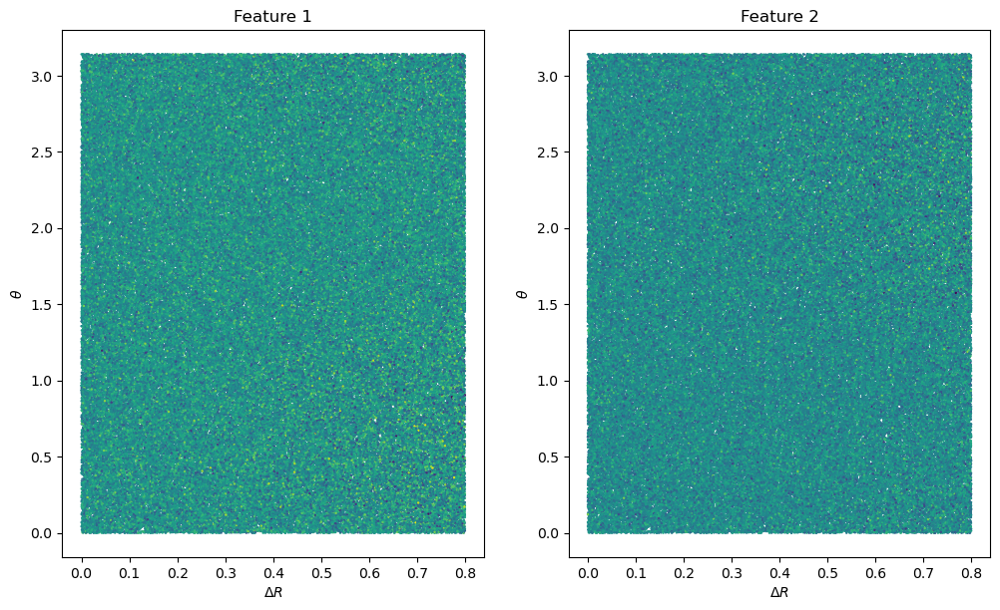

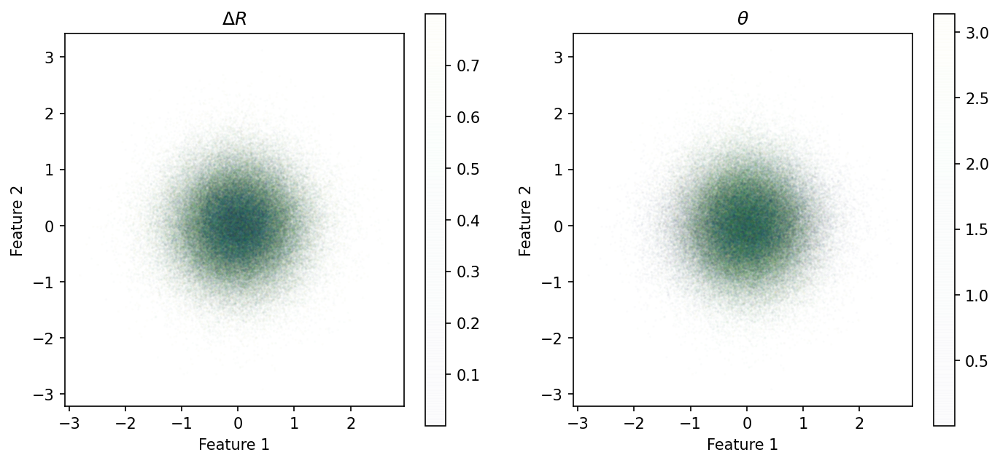

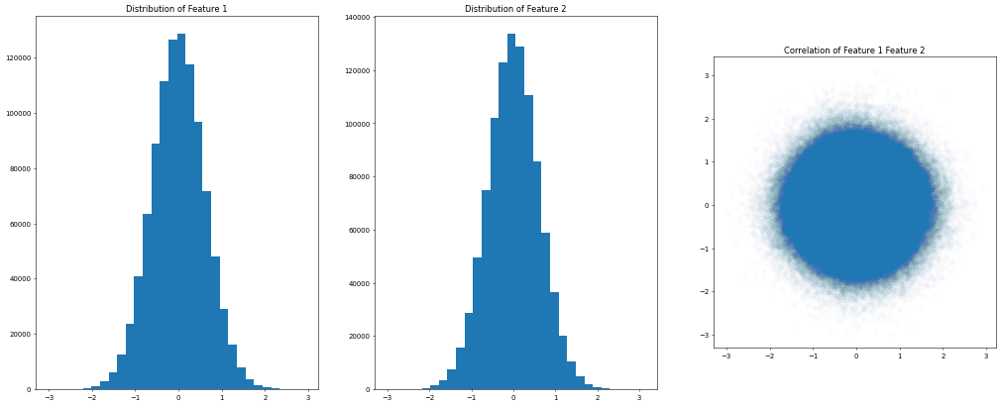

In [9]:
feature_pca = f.pca(samples,2)
lj.plot_pars_feature(feature_pca[0], water.deltaR, water.theta,)
lj.plot_feature_pars(feature_pca[0], water.deltaR, water.theta,)
lj.plot_feature_hists(feature_pca[0])
calculated_rmis["pca"] = inf.RenormalizedMutualInformation(*feature_pca)

### Feature parametrized with a neural network

In [20]:
n_out = 2

# Number of neurons in each layer of the network
n_neurons = 800

batchsize = 5000
N_batches = int(N_samples/batchsize)-1

# How many times train over the entire dataset (on average)
N_epochs = 25


# Options to estimate the entropy H(y)
# Number of bins
H_nbins = 100

# Size of the kernel placed on each point
# to make the histogram differentiable
# (in units of the histogram-cell-width)
H_kernel_size = 2

# Strength of the constraint on the output distribution
# of the feature (exploiting reparametrization invariance)
coeff_gauss = 0.05

# Amplitude of the regularization to encourage
# feature smoothness (amplitude e^{-n/decay})
reg_amplitude = 15

# Decay time of the regularizing term
reg_decay = 500
eta = 0.0001

In [21]:
# Define the layout of the neural network
# The cost function is implicit when choosing the model RMIOptimizer
rmi_optimizer = nn.RMIOptimizer(H_nbins,
                            H_kernel_size,
                            coeff_gauss = coeff_gauss,
                            reg_amplitude=reg_amplitude,
                            reg_decay = reg_decay,
                             layers=[
    nn.K.layers.Dense(n_neurons, activation="relu",
                  input_shape=(n_in,)),
    nn.K.layers.Dense(n_out)
])

# Compile the network === choose the optimizer to use during the training
rmi_optimizer.compile(optimizer=nn.tf.optimizers.RMSprop(eta, epsilon=1e-9))

# Define an objects that handles the training and 
# automatically saves the model and the training history
rmi_net = nn.Net(rmi_optimizer,
                 path="models/liquid-drop",
                 mode="a")

Loaded neural network weights from models/liquid-drop


In [27]:
# Perform the training of the neural network
rmi_net.fit_generator(lambda: get_batch(batchsize)[0], int(N_epochs*N_batches))

Model already trained, skipping training.


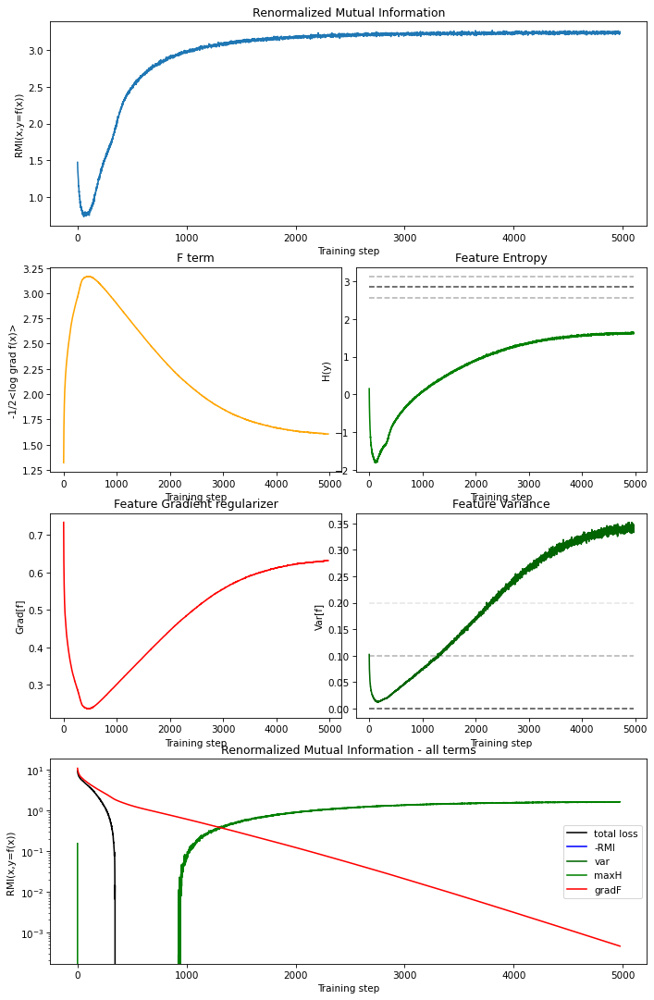

In [28]:
# Plot the training history (and other useful quantities)
rmi_net.plot_rmi_cost()

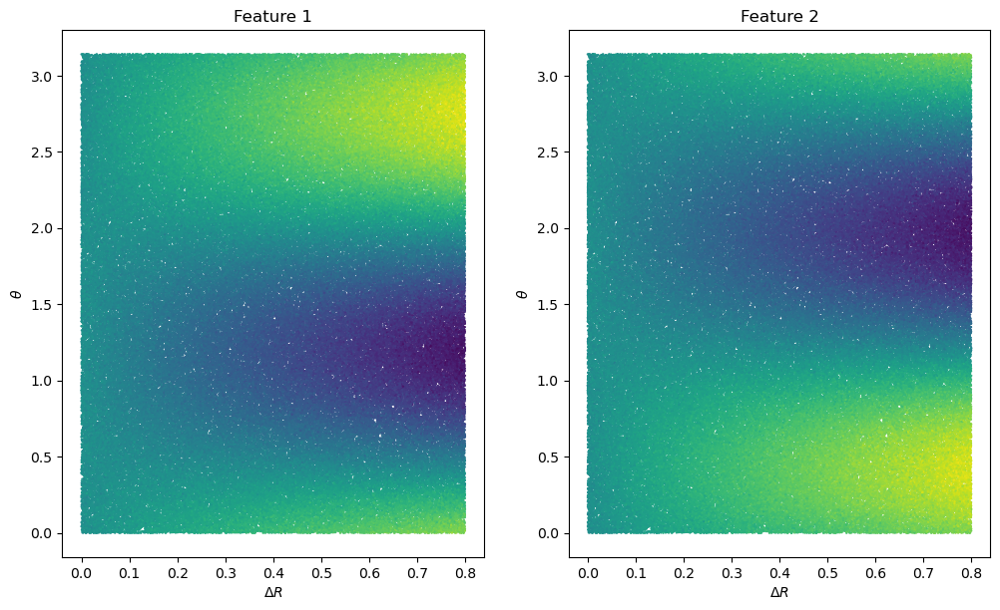

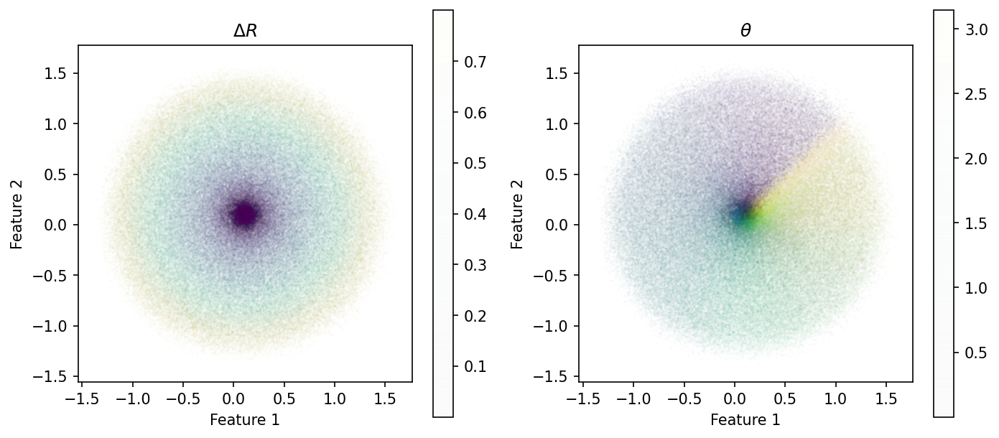

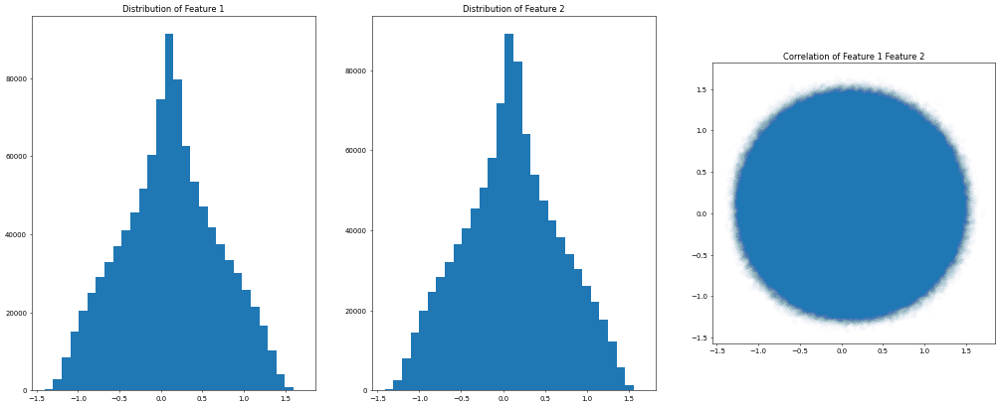

3.220324010487118


In [19]:
# Plot the feature extracted by optimizing the neural network
feature_rmi = rmi_net.get_feature_and_grad(samples)
lj.plot_pars_feature(feature_rmi[0], water.deltaR, water.theta)
lj.plot_feature_pars(feature_rmi[0], water.deltaR, water.theta)
lj.plot_feature_hists(feature_rmi[0])
calculated_rmis["nn"] = inf.RenormalizedMutualInformation(*rmi_net.get_feature_and_grad(samples))
print(calculated_rmis["nn"])

### Autoencoder

Train a contractive autoencoder to reconstruct the input
The bottleneck is considered as the extracted feature
We use a `nn.RMIOptimizer` model to be able to quickly evaluate
the RMI of the feature


In [46]:
# Encoder
encoder = nn.RMIOptimizer(H_nbins,
                          H_kernel_size, layers=[
    nn.K.layers.Dense(n_neurons, activation="relu",
                  input_shape=(n_in,)),
    nn.K.layers.Dense(n_out)
])

# Decoder
decoder = nn.K.Sequential(layers=[
    nn.K.layers.Dense(n_neurons, activation="relu",
                  input_shape=(n_out,)),
    nn.K.layers.Dense(n_in)
])

# Autoencoder
autoencoder = nn.Supervised(cost="mse_contract", layers=[encoder, decoder])
autoencoder.compile(optimizer=nn.tf.optimizers.RMSprop(eta))

ae_net = nn.Net(autoencoder, 
                path="models/liquiddrop-ae",
                mode="a")

enc_net = nn.Net(encoder)

Loaded neural network weights from models/liquiddrop-ae


In [47]:
ae_net.fit_generator(lambda: get_batch(batchsize)[0], int(N_epochs*N_batches))

Model already trained, skipping training.


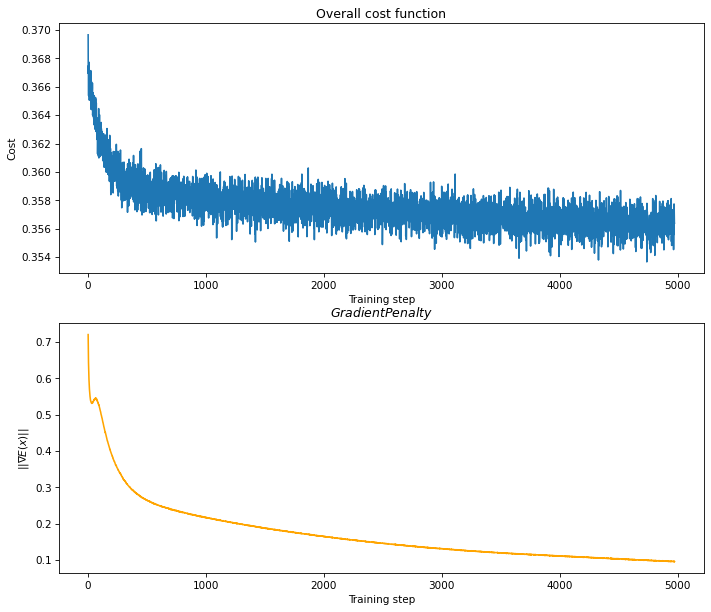

In [29]:
ae_net.plot_mse_contractive_costs()

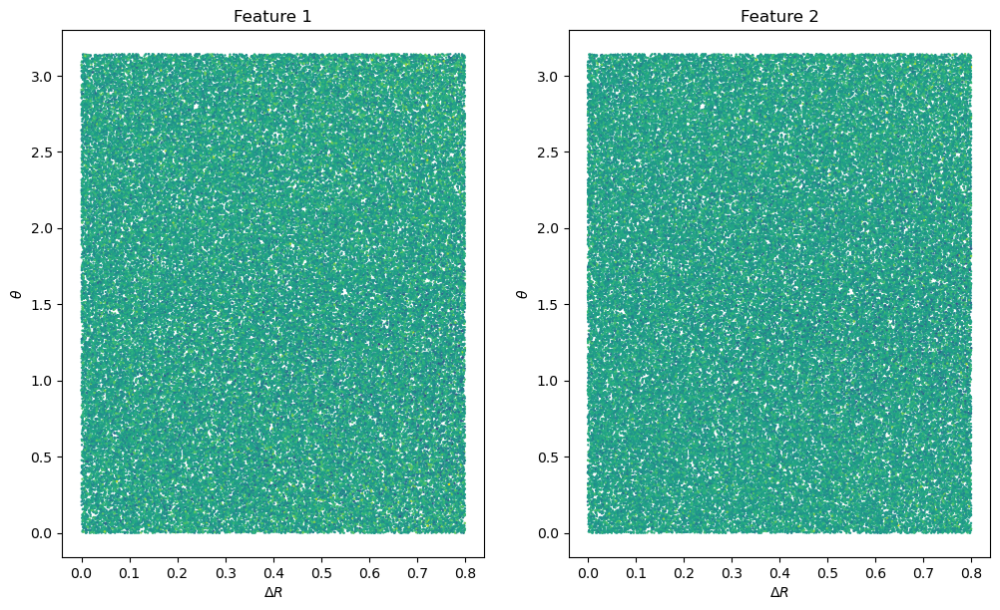

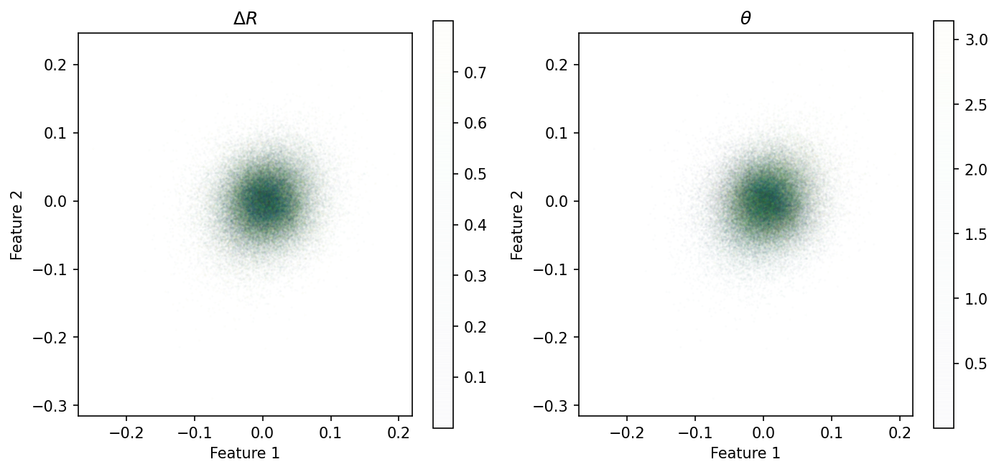

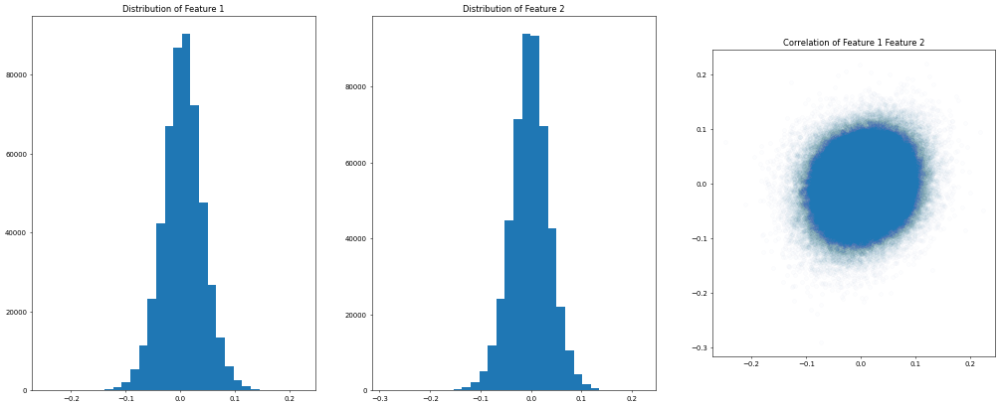

1.674844760630208


In [30]:
N_show = 500000
feature_ae = enc_net.get_feature_and_grad(samples[:N_show])
lj.plot_pars_feature(feature_ae[0], water.deltaR[:N_show], water.theta[:N_show])
lj.plot_feature_pars(feature_ae[0], water.deltaR[:N_show], water.theta[:N_show])
lj.plot_feature_hists(feature_ae[0])
calculated_rmis["ae"] = inf.RenormalizedMutualInformation(*feature_ae)
print(calculated_rmis["ae"])

 Drop #000: dr=0.49, th=3.04



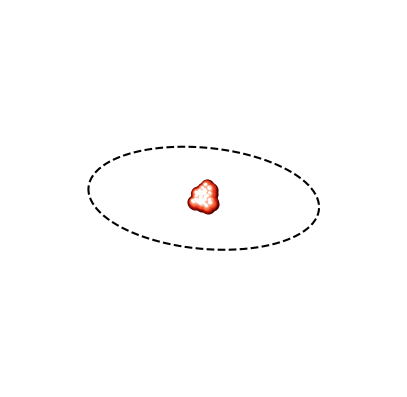

 Drop #001: dr=0.34, th=0.24



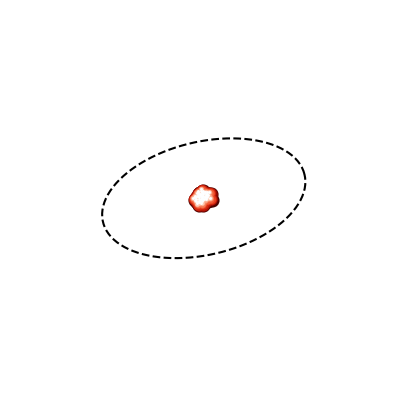

 Drop #002: dr=0.25, th=1.13



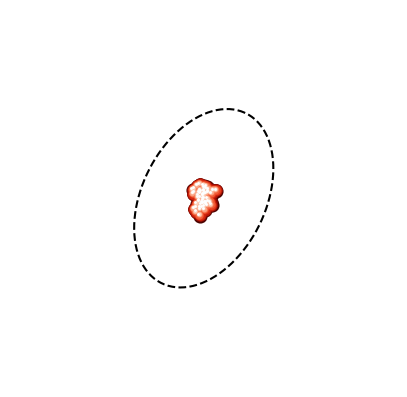

In [31]:
N_test = 200
N_particles = int(n_in/2)
x_batch = get_batch(N_test)[0]
y_batch = ae_net(x_batch).T

prt =np.zeros([N_test, N_particles, 2])
prt[...,0] = y_batch[:,:N_particles]
prt[...,1] = y_batch[:,N_particles:]

for i in range(3):
    print(" Drop #{:03}: dr={:.2f}, th={:.2f}\n".format(i,water.deltaR.flatten()[i],water.theta.flatten()[i] ))
    lj.plot_drop(i,prt,water,interactions,show3d=True)

---
## Analyze deformation range dependence

We consider different ranges of possible deformation of the liquid drop. The smaller the range, the close the drops will look similar to a cirle and their orientation will become undistinguishable.

We compare various features. A different neural network should be trained for each different deformation range (one can run it through a script and use the following code to analyze the results)

In [13]:
# Possible deformations of the drop range between 0 and n_linsp[i]
# We remind that the deformation is deltaR such that the semiaxes of the ellipse are
# a = R + deltaR
# b = R^2/a
n_linsp = np.linspace(0.1,0.8,20) 

outputs = []
for i in trange(len(n_linsp)):
    smpl =samples[water.deltaR.flatten()<n_linsp[i]]
    
    # Comment this line to always use the same model
    # (previously trained in this notebook)
    # instead of using a different neural network 
    # for each noise value
    try:
        rmi_net.load("models/liquid-drop_range_" + str(i))
        ae_net.load("models/liquid-drop_ae_range_" + str(i))
    except Exception:
        print(str(i) + " not found")
        
    minf = inf.print_feature_batch(smpl,
                        [rmi_net.get_feature_and_grad, lj.variance, lj.handcrafted_feature, 
                         lambda sample: f.pca(smpl,2), enc_net.get_feature_and_grad], 
                        ["NN",  "Variance", "Handcrafted", "PCA", "Autoencoder"],
                        is_printing=False);
    outputs.append(np.array(minf))
    
outputs_array = np.array(outputs)

  0%|          | 0/20 [00:00<?, ?it/s]

Loaded neural network weights from models/liquid-drop_range_0
Loaded neural network weights from models/liquid-drop_ae_range_0


  5%|▌         | 1/20 [00:02<00:42,  2.25s/it]

Loaded neural network weights from models/liquid-drop_range_1
Loaded neural network weights from models/liquid-drop_ae_range_1


 10%|█         | 2/20 [00:05<00:47,  2.64s/it]

Loaded neural network weights from models/liquid-drop_range_2
Loaded neural network weights from models/liquid-drop_ae_range_2


 15%|█▌        | 3/20 [00:08<00:52,  3.10s/it]

Loaded neural network weights from models/liquid-drop_range_3
Loaded neural network weights from models/liquid-drop_ae_range_3


 20%|██        | 4/20 [00:15<01:14,  4.64s/it]

Loaded neural network weights from models/liquid-drop_range_4
Loaded neural network weights from models/liquid-drop_ae_range_4


 25%|██▌       | 5/20 [00:22<01:21,  5.40s/it]

Loaded neural network weights from models/liquid-drop_range_5
Loaded neural network weights from models/liquid-drop_ae_range_5


 30%|███       | 6/20 [00:30<01:26,  6.16s/it]

Loaded neural network weights from models/liquid-drop_range_6
Loaded neural network weights from models/liquid-drop_ae_range_6


 35%|███▌      | 7/20 [00:36<01:22,  6.35s/it]

Loaded neural network weights from models/liquid-drop_range_7
Loaded neural network weights from models/liquid-drop_ae_range_7


 40%|████      | 8/20 [00:44<01:20,  6.71s/it]

Loaded neural network weights from models/liquid-drop_range_8
Loaded neural network weights from models/liquid-drop_ae_range_8


 45%|████▌     | 9/20 [00:52<01:19,  7.25s/it]

Loaded neural network weights from models/liquid-drop_range_9
Loaded neural network weights from models/liquid-drop_ae_range_9


 50%|█████     | 10/20 [01:02<01:19,  7.92s/it]

Loaded neural network weights from models/liquid-drop_range_10
Loaded neural network weights from models/liquid-drop_ae_range_10


 55%|█████▌    | 11/20 [01:12<01:17,  8.56s/it]

Loaded neural network weights from models/liquid-drop_range_11
Loaded neural network weights from models/liquid-drop_ae_range_11


 60%|██████    | 12/20 [01:23<01:14,  9.29s/it]

Loaded neural network weights from models/liquid-drop_range_12
Loaded neural network weights from models/liquid-drop_ae_range_12


 65%|██████▌   | 13/20 [01:35<01:10, 10.07s/it]

Loaded neural network weights from models/liquid-drop_range_13
Loaded neural network weights from models/liquid-drop_ae_range_13


 70%|███████   | 14/20 [01:47<01:05, 10.85s/it]

Loaded neural network weights from models/liquid-drop_range_14
Loaded neural network weights from models/liquid-drop_ae_range_14


 75%|███████▌  | 15/20 [02:04<01:02, 12.52s/it]

Loaded neural network weights from models/liquid-drop_range_15
Loaded neural network weights from models/liquid-drop_ae_range_15


 80%|████████  | 16/20 [02:18<00:52, 13.02s/it]

Loaded neural network weights from models/liquid-drop_range_16
Loaded neural network weights from models/liquid-drop_ae_range_16


 85%|████████▌ | 17/20 [02:36<00:44, 14.71s/it]

Loaded neural network weights from models/liquid-drop_range_17
Loaded neural network weights from models/liquid-drop_ae_range_17


 90%|█████████ | 18/20 [02:52<00:30, 15.02s/it]

Loaded neural network weights from models/liquid-drop_range_18
Loaded neural network weights from models/liquid-drop_ae_range_18


 95%|█████████▌| 19/20 [03:12<00:16, 16.50s/it]

Loaded neural network weights from models/liquid-drop_range_19
Loaded neural network weights from models/liquid-drop_ae_range_19


100%|██████████| 20/20 [03:29<00:00, 10.46s/it]


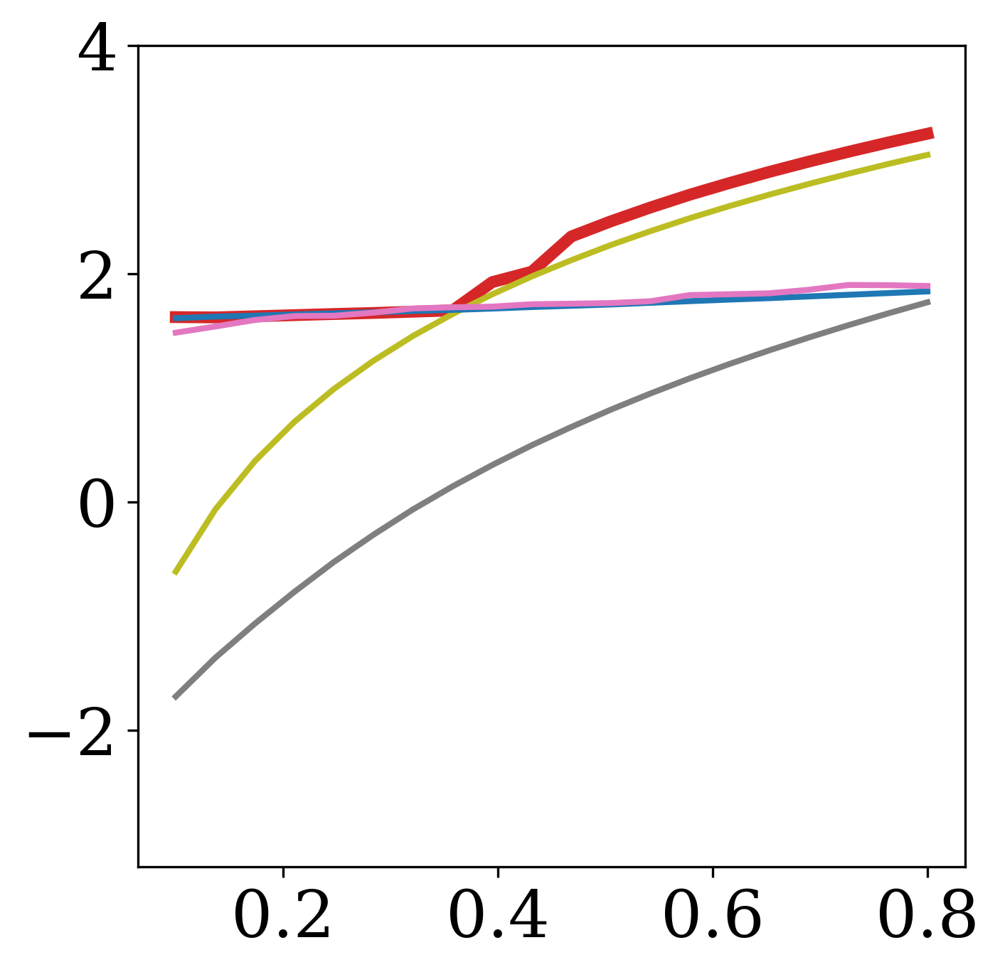

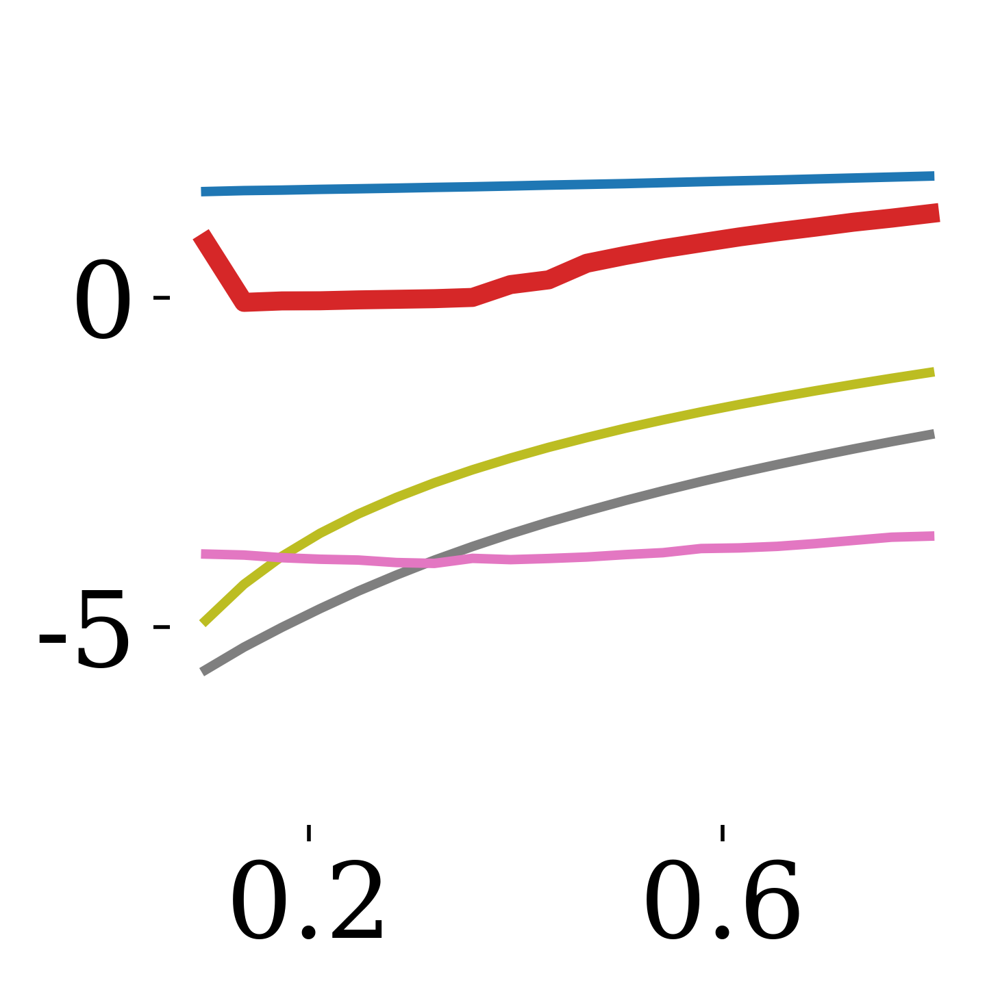

In [14]:
import matplotlib.pyplot as plt
prop_cycle = plt.rcParams['axes.prop_cycle']
cols = prop_cycle.by_key()['color']

# Plot the RMI values vs noise strength for different features
# Legend is disabled when saving the plot 
# Just to generate the plots for the paper
inf.plot_feature_batch(n_linsp,outputs_array,
                       fig="figures/liquiddrop_rmi",
                       ylims=np.array([[-3.2,4],[-8,4]]),
                       save=True,
                       cols=[cols[3], cols[7],cols[8],cols[0],cols[6]])

In [32]:
#Summary
rmi_net.load("models/liquid-drop_range_19")
ae_net.load("models/liquid-drop_ae_range_19")

N_show = 500000

feature_nn = rmi_net.get_feature_and_grad(samples[:N_show])
calculated_rmis["nn"] = inf.RenormalizedMutualInformation(*feature_nn)

feature_ae = enc_net.get_feature_and_grad(samples[:N_show])
calculated_rmis["ae"] = inf.RenormalizedMutualInformation(*feature_ae)

def format_bar(val,max_val=calculated_rmis["nn"],length=18):
    return "{empty:#^{val}}".format(empty="",val=int(val/max_val*length))

print("")
print("\t|{:-^47}|".format(""))
print("\t|{:^47}|".format(" Renormalized Mutual Information "))
print("\t|{:=^47}|".format(""))
print("\t|{:>15}{:^12.2f}{:.<18}  |".format("Variance:", calculated_rmis["var"],format_bar(calculated_rmis["var"])))
print("\t|{:>15}{:^12.2f}{:.<18}  |".format("Handcrafted:", calculated_rmis["hc"],format_bar(calculated_rmis["hc"])))
print("\t|{:>15}{:^12.2f}{:.<18}  |".format("PCA:", calculated_rmis["pca"],format_bar(calculated_rmis["pca"])))
print("\t|{:>15}{:^12.2f}{:.<18}  |".format("Autoencoder:", calculated_rmis["ae"],format_bar(calculated_rmis["ae"])))
print("\t|{:>15}{:^12.2f}{:.<18}  |".format("Neural Network:", calculated_rmis["nn"],format_bar(calculated_rmis["nn"])))
print("\t|{:-^47}|".format(""))
print("")


Loaded neural network weights from models/liquid-drop_range_19
Loaded neural network weights from models/liquid-drop_ae_range_19

	|-----------------------------------------------|
	|        Renormalized Mutual Information        |
	|===============================================|
	|      Variance:    1.75    #########.........  |
	|   Handcrafted:    3.04    #################.  |
	|           PCA:    1.85    ##########........  |
	|   Autoencoder:    1.89    ##########........  |
	|Neural Network:    3.22    ##################  |
	|-----------------------------------------------|



---

## Supervised task starting from the feature representation

In [33]:
neurons_supervised = 100
eta_supervised = 0.0001
batchsize_supervised = 1500
N_epochs_supervised=100
N_batches_supervised = int(N_samples/batchsize)-1
N_train_supervised = N_epochs_supervised*N_batches_supervised

In [24]:
def get_superv_batch(batchsize, training_feature, training_label):
    """ Get a batch of (training_samples, training_labels)
    """
    random_indices = np.random.choice(np.arange(len(training_feature)),size=batchsize)
    feature_batch = training_feature[random_indices]
    label_batch = training_label[random_indices]
    return feature_batch, label_batch

def new_supervised_net(n_neurons, eta):
    """Initialize a new neural network

    We use a modified version of mean squared error as a cost function
    to take into account the fact that one of the labels is an angle.

    Args:
        n_neurons (int): number of neurons
        eta (float): learning rate

    Returns:
        nn.K.Model: neural network model
    """
    net = nn.Supervised(cost="mse_lj",
        layers=[
        nn.K.layers.Dense(neurons_supervised, activation="relu",
                      input_shape=(2,)),
        nn.K.layers.Dense(neurons_supervised, activation="relu"),
        nn.K.layers.Dense(3)
    ])
    net.compile(optimizer = nn.tf.optimizers.Adam(eta_supervised))
    return net


def plot_class_out(out,label="Feature", skip=5):
    """Plot results of supervised network training
    """
    plt.figure(figsize=[12,15],dpi=100)
    plt.suptitle("Supervised network built from {}".format(label))
    plt.subplot(3,2,1)
    plt.gca().set_aspect("equal")
    plt.xlabel(r"$\Delta R$")
    plt.ylabel(r"Predicted $\Delta R$")
    plt.scatter(water.deltaR.flatten()[::skip],out[:,0][::skip],alpha=0.003)

    plt.subplot(3,2,2)
    plt.gca().set_aspect("equal")
    plt.xlabel(r"$\theta$")
    plt.ylabel(r"Predicted $\theta$")
    plt.scatter(2*water.theta.flatten()[::skip]-np.pi,np.arctan2(out[:,2][::skip],out[:,1][::skip]),alpha=0.003)

    plt.subplot(3,2,3)
    plt.gca().set_aspect("equal")
    plt.xlabel(r"$\Delta \cos\theta$")
    plt.ylabel(r"Predicted $\Delta \cos \theta$")
    plt.scatter(np.cos(2*water.theta.flatten()[::skip]),out[:,1][::skip],alpha=0.003)

    plt.subplot(3,2,4)
    plt.gca().set_aspect("equal")
    plt.xlabel(r"$\Delta \sin \theta$")
    plt.ylabel(r"Predicted $\Delta \sin\theta$")
    plt.scatter(np.sin(2*water.theta.flatten()[::skip]),out[:,2][::skip],alpha=0.003)


    plt.subplot(3,2,5)
    plt.gca().set_aspect("equal")
    plt.xlabel(r"$r^*\Delta \cos\theta$")
    plt.ylabel(r"Predicted $r^*\Delta \cos \theta$")
    plt.scatter(water.deltaR.flatten()[::skip]*np.cos(2*water.theta.flatten()[::skip]),water.deltaR.flatten()[::skip]*out[:,1][::skip],alpha=0.003)

    plt.subplot(3,2,6)
    plt.gca().set_aspect("equal")
    plt.xlabel(r"$r^*\Delta \sin\theta$")
    plt.ylabel(r"Predicted $r^*\Delta \sin \theta$")
    plt.scatter(water.deltaR.flatten()[::skip]*np.sin(2*water.theta.flatten()[::skip]),water.deltaR.flatten()[::skip]*out[:,2][::skip],alpha=0.003)


    plt.show()
    
    

# Define the training dataset for the supervised task
training_label = np.array([water.deltaR.flatten(),
                           np.cos(water.theta.flatten()),
                           np.sin(water.theta.flatten())]).T

### Neural Network feature

In [26]:
supervised_rmi = new_supervised_net(neurons_supervised, eta_supervised)
s_rmi_net = nn.Net(supervised_rmi,
                   path = "models/liquiddrop-sup-rmi",
                   mode="a")
s_rmi_net.summary()

Loaded neural network weights from models/liquiddrop-sup-rmi
Model: "supervised_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 100)               300       
_________________________________________________________________
dense_10 (Dense)             (None, 100)               10100     
_________________________________________________________________
dense_11 (Dense)             (None, 3)                 303       
Total params: 10,703
Trainable params: 10,703
Non-trainable params: 0
_________________________________________________________________


In [27]:
rmi_net.load("models/liquid-drop_range_19")
feature_rmi = rmi_net.get_feature_and_grad(samples)

s_rmi_net.fit_generator(lambda: get_superv_batch(batchsize_supervised,
                                       feature_rmi[0],
                                       training_label), N_train_supervised)

Loaded neural network weights from models/liquid-drop_range_19
Model already trained, skipping training.


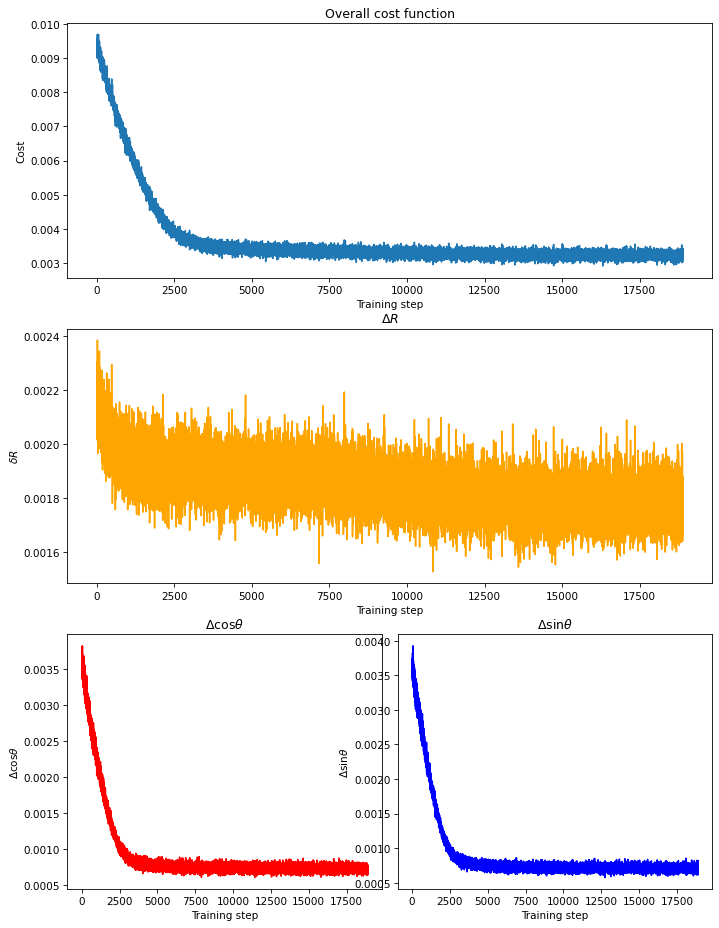

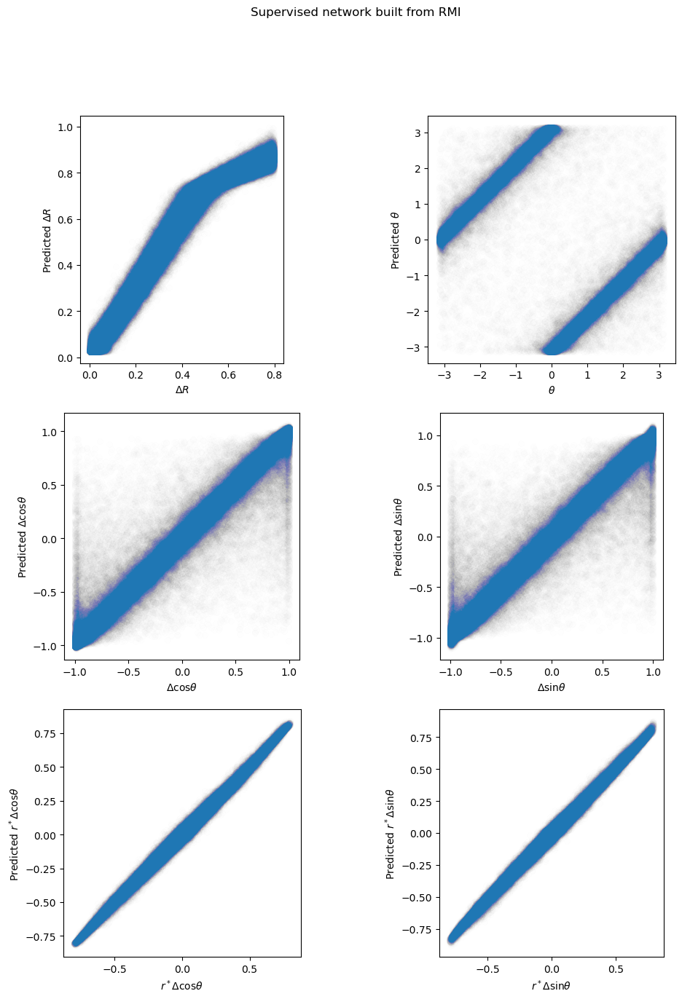

In [28]:
s_rmi_net.plot_mse_lj_costs(1000)
plot_class_out(s_rmi_net(feature_rmi[0]).T, "RMI")

### Handcrafted Feature 
$$
\sum (x_i^{(1)})^2, \sum (x_i^{(1)} x_i^{(2)})
$$

where $(1)$, $(2)$ are the two coordinates of particle $i$

In [31]:
supervised_hc = new_supervised_net(neurons_supervised, eta_supervised)
s_hc_net = nn.Net(supervised_hc,
                   path = "models/liquiddrop-sup-hc",
                   mode="a")

Loaded neural network weights from models/liquiddrop-sup-hc


In [32]:
s_hc_net.fit_generator(lambda: get_superv_batch(batchsize_supervised,
                                       feature_hc[0],
                                       training_label), N_train_supervised)

Model already trained, skipping training.


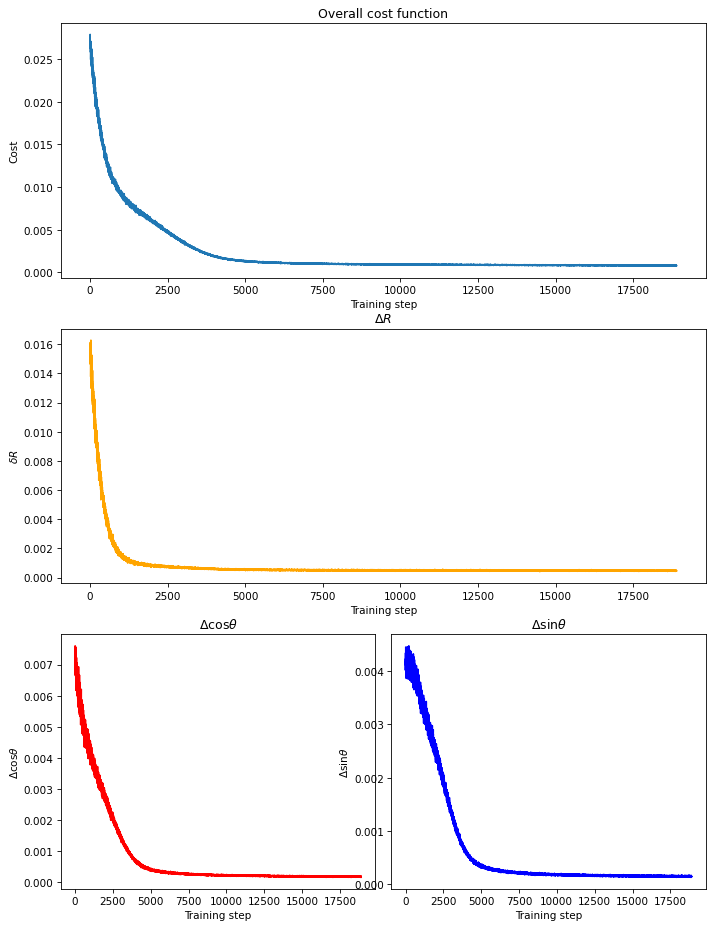

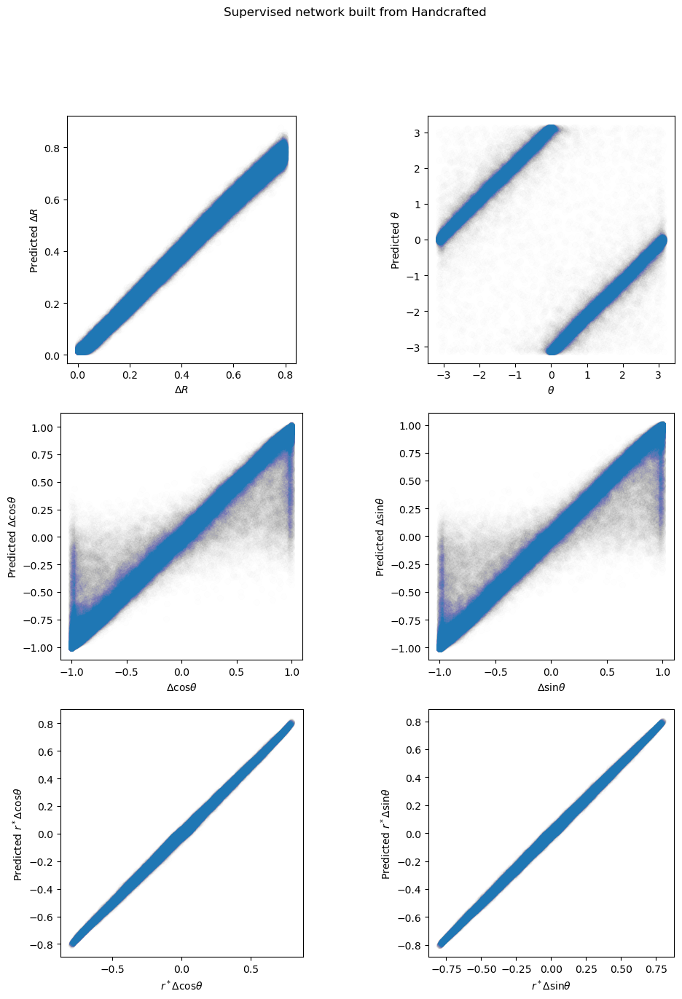

In [34]:
s_hc_net.plot_mse_lj_costs(1000)
plot_class_out(s_hc_net(feature_hc[0]).T, "Handcrafted")

### Variance Feature
$$
\sum (x_i^{(1)})^2,  (x_i^{(2)})^2
$$
where $(1)$, $(2)$ are the two coordinates of particle $i$

In [35]:
supervised_var = new_supervised_net(neurons_supervised, eta_supervised)
s_var_net = nn.Net(supervised_var,
                   path = "models/liquiddrop-sup-var",
                   mode="a")

Loaded neural network weights from models/liquiddrop-sup-var


In [36]:
s_var_net.fit_generator(lambda: get_superv_batch(batchsize_supervised,
                                       feature_var[0],
                                       training_label), N_train_supervised)

Model already trained, skipping training.


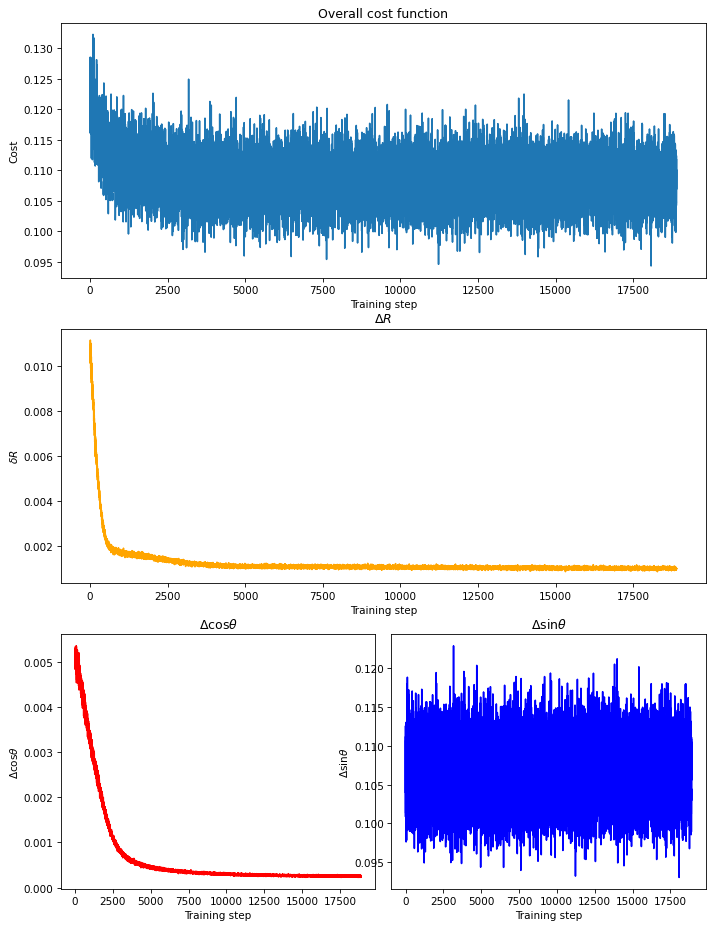

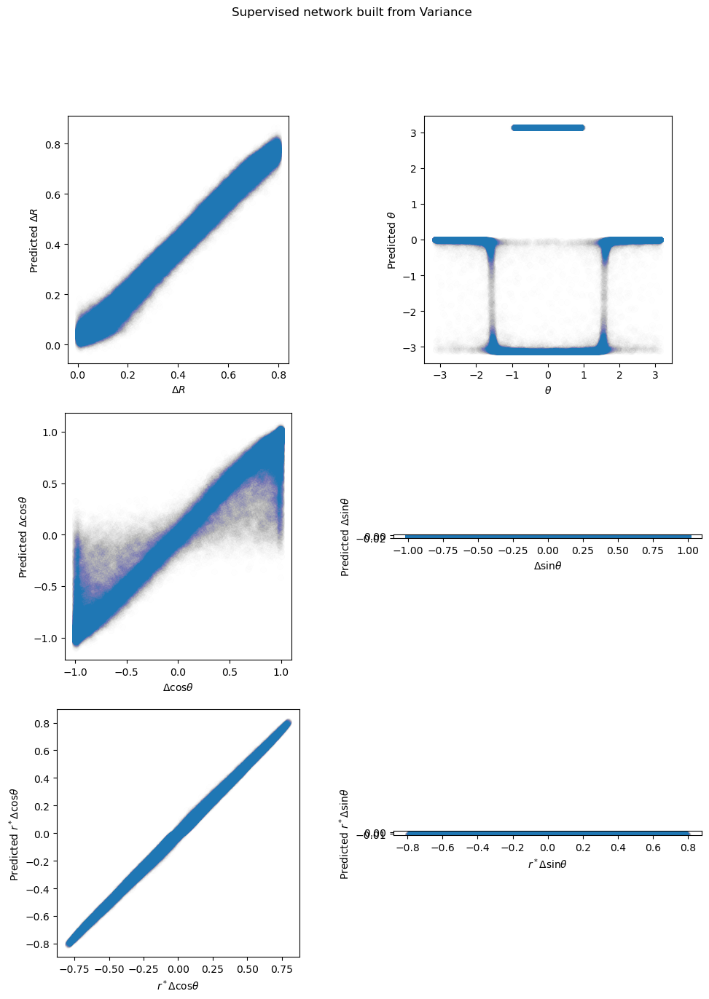

In [37]:
s_var_net.plot_mse_lj_costs(1000)
plot_class_out(s_var_net(feature_var[0]).T, "Variance")

### Autoencoder Feature

In [38]:
supervised_ae = new_supervised_net(neurons_supervised, eta_supervised)
s_ae_net = nn.Net(supervised_ae,
                   path = "models/liquiddrop-sup-ae",
                   mode="a")

In [39]:
ae_net.load("models/liquid-drop_ae_range_19")
feature_ae = enc_net.get_feature_and_grad(samples)
s_ae_net.fit_generator(lambda: get_superv_batch(batchsize_supervised,
                                       feature_ae[0],
                                       training_label), N_train_supervised)

Loaded neural network weights from models/liquid-drop_ae_range_19


  0%|          | 0/19900 [00:00<?, ?it/s]

Starting the training of the model...


100%|██████████| 19900/19900 [00:49<00:00, 403.09it/s]


Saved neural network weights to models/liquiddrop-sup-ae


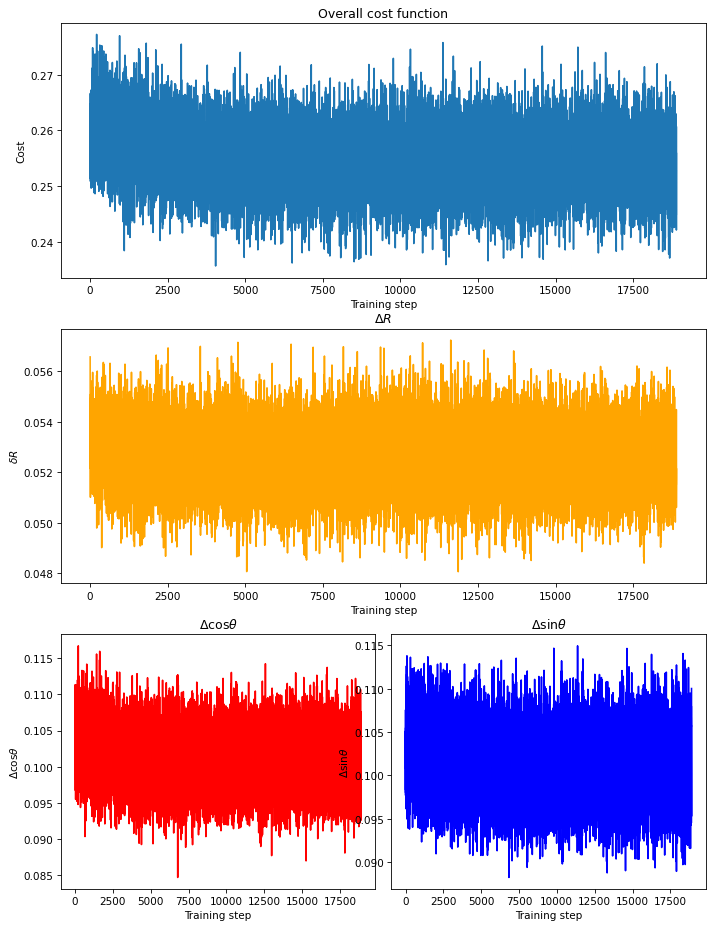

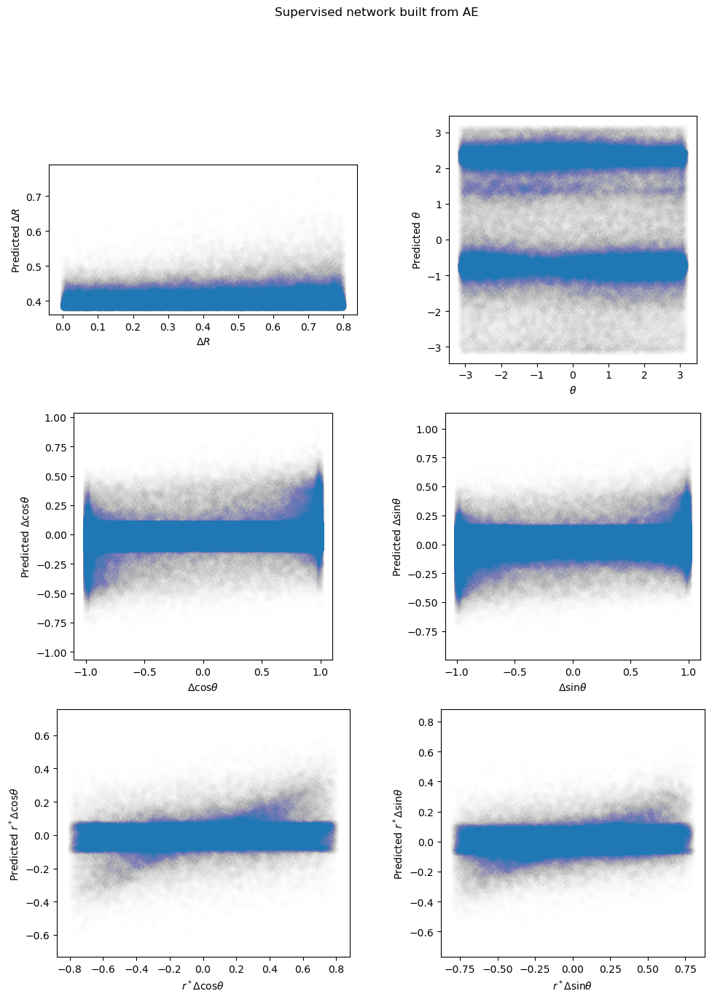

In [40]:
s_ae_net.plot_mse_lj_costs(1000)
plot_class_out(s_ae_net(feature_ae[0]).T, "AE")

### PCA

In [41]:
supervised_pca = new_supervised_net(neurons_supervised, eta_supervised)
s_pca_net = nn.Net(supervised_pca,
                   path = "models/liquiddrop-sup-pca",
                   mode="a")

Loaded neural network weights from models/liquiddrop-sup-pca


In [42]:
s_pca_net.fit_generator(lambda: get_superv_batch(batchsize_supervised,
                                       feature_pca[0],
                                       training_label), N_train_supervised)

Model already trained, skipping training.


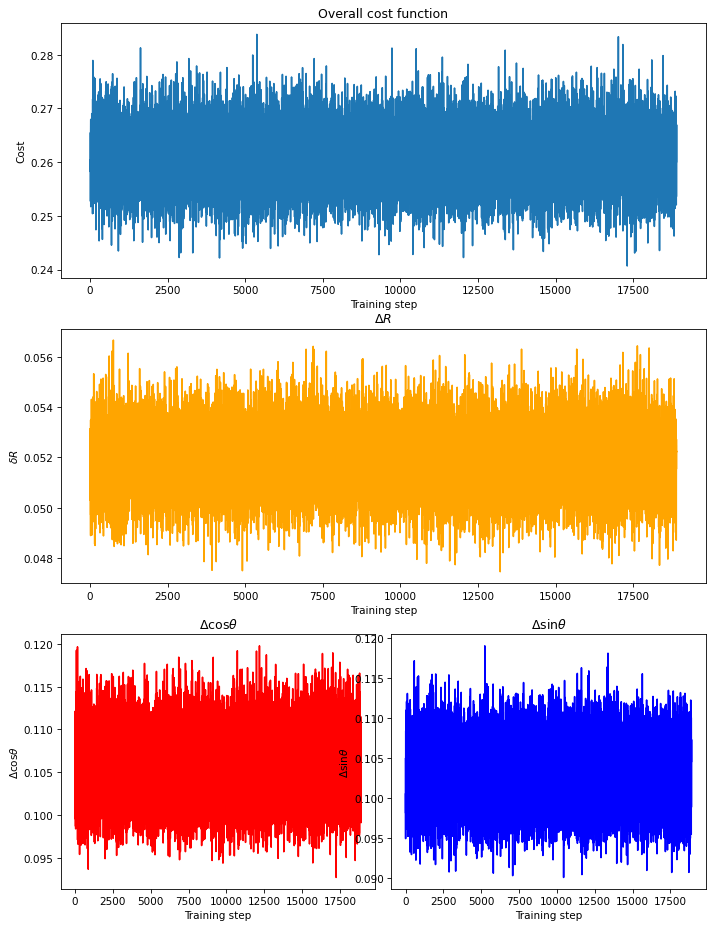

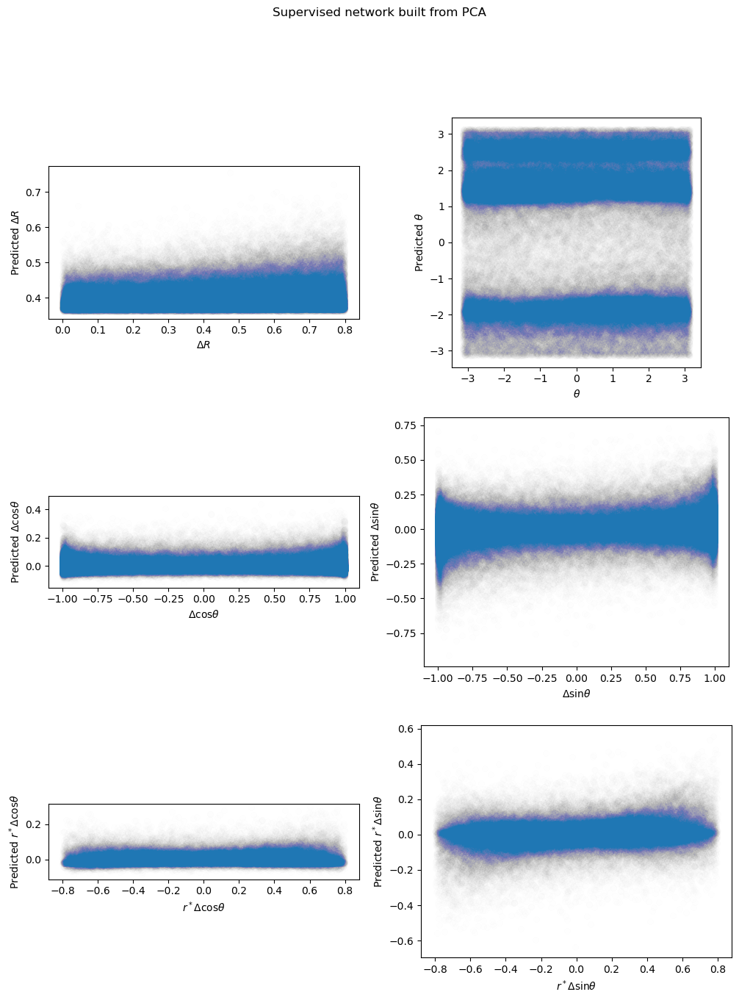

In [43]:
s_pca_net.plot_mse_lj_costs(1000)
plot_class_out(s_pca_net(feature_pca[0]).T, "PCA")

---

### Compare the performance of the Supervised Networks

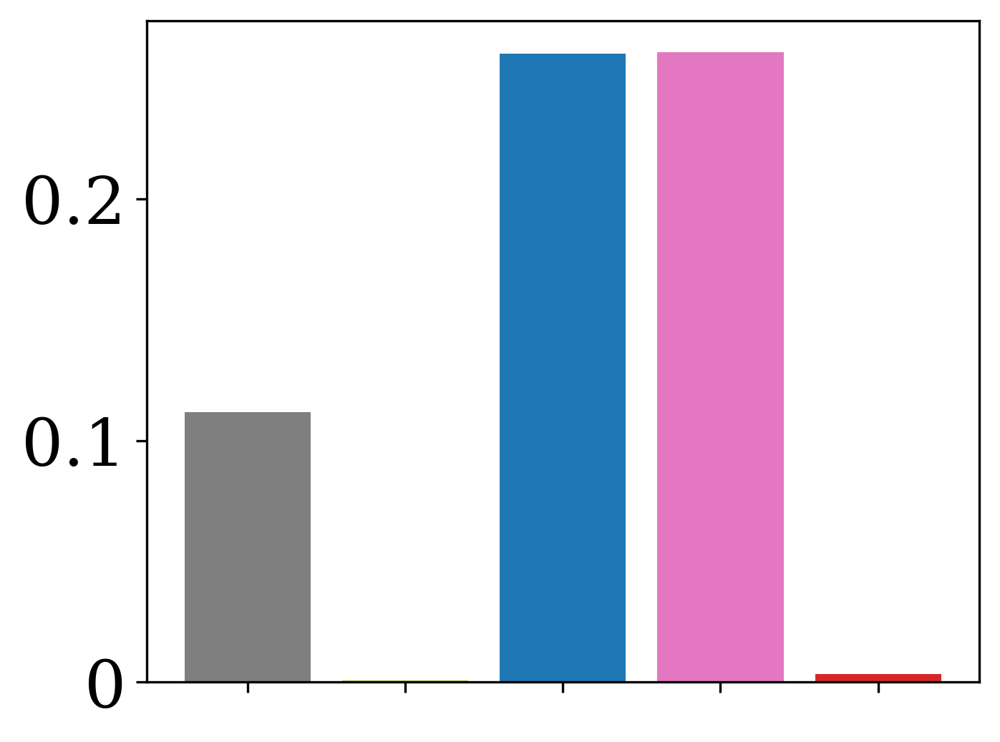

In [51]:
prop_cycle = plt.rcParams['axes.prop_cycle']
cols = prop_cycle.by_key()['color']

font = {'family': 'DejaVu Serif',
        'weight': 'regular',
        'size': 22}
plt.rc('font', **font)

plt.figure(figsize=[5,4],dpi=300)
# plt.semilogy()
plt.bar(np.array(np.arange(5)),
        np.array([s_var_net.history[-1][0],
        s_hc_net.history[-1][0],
        s_pca_net.history[-1][0],
        s_ae_net.history[-1][0],
        s_rmi_net.history[-1][0]]), 
        tick_label="",
        color=[cols[7],cols[8], cols[0],cols[6] ,cols[3]]
       )

plt.yticks([0.2,0.1,0], ["0.2","0.1","0"])
plt.savefig("figures/liquid-drop-supervised.pdf")
plt.show()

In [47]:
def format_bar(val,max_val=s_pca_net.history[-1][0],length=28):
    return "{empty:#^{val}}".format(empty="",val=int(val/max_val*length))

print("")
print("\t|{:-^56}|".format(""))
print("\t|{:^56}|".format(" Final Cost - Supervised Task "))
print("\t|{:=^56}|".format(""))
print("\t|{:>15}{:^12.4f}{:.<28} |".format("VAR:", s_var_net.history[-1][0],format_bar(s_var_net.history[-1][0])))
print("\t|{:>15}{:^12.4f}{:.<28} |".format("HC:", s_hc_net.history[-1][0],format_bar(s_hc_net.history[-1][0])))
print("\t|{:>15}{:^12.4f}{:.<28} |".format("PCA:", s_pca_net.history[-1][0],format_bar(s_pca_net.history[-1][0])))
print("\t|{:>15}{:^12.4f}{:.<28} |".format("AE:", s_ae_net.history[-1][0],format_bar(s_ae_net.history[-1][0])))
print("\t|{:>15}{:^12.4f}{:.<28} |".format("NN:", s_rmi_net.history[-1][0],format_bar(s_rmi_net.history[-1][0])))
print("\t|{:-^56}|".format(""))
print("")



	|--------------------------------------------------------|
	|              Final Cost - Supervised Task              |
	|========================================================|
	|           VAR:   0.1117   ############................ |
	|            HC:   0.0008   ............................ |
	|           PCA:   0.2601   ############################ |
	|            AE:   0.2606   ############################ |
	|            NN:   0.0033   ............................ |
	|--------------------------------------------------------|



Plot value of supervised cost function during training

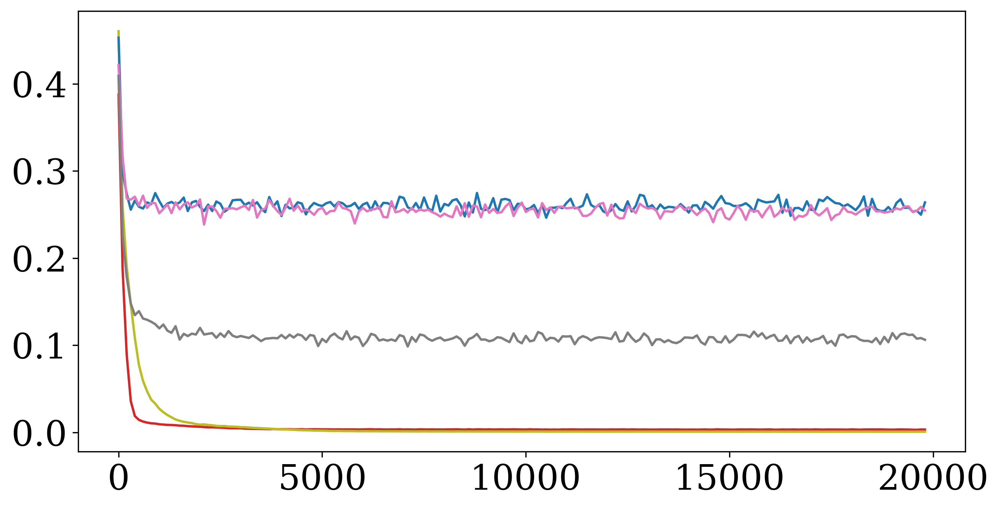

In [48]:
start = 0
skip = 100
plt.figure(figsize=[10,5],dpi=300)
# plt.title("Training supervised task")
# plt.xlabel("Training step")
# plt.ylabel("Cost")
hst = np.transpose(s_rmi_net.history)
hst = np.vstack([np.arange(len(hst.T)),hst])
plt.plot(hst[0,start::skip],hst[1,start::skip], label="NN", c=cols[3])

hst = np.transpose(s_hc_net.history)
hst = np.vstack([np.arange(len(hst.T)),hst])
plt.plot(hst[0,start::skip],hst[1,start::skip],label="HC", c=cols[8])

hst = np.transpose(s_pca_net.history)
hst = np.vstack([np.arange(len(hst.T)),hst])
plt.plot(hst[0,start::skip],hst[1,start::skip],label="PCA", c=cols[0])

hst = np.transpose(s_ae_net.history)
hst = np.vstack([np.arange(len(hst.T)),hst])
plt.plot(hst[0,start::skip],hst[1,start::skip],label="AE", c=cols[6])

hst = np.transpose(s_var_net.history)
hst = np.vstack([np.arange(len(hst.T)),hst])
plt.plot(hst[0,start::skip],hst[1,start::skip],label="VAR", c=cols[7])
# plt.legend()
plt.savefig("figures/liquid-drop-supervised-comparison.pdf")
plt.show()

---

### Pictures for the paper/slides

In [49]:
def plot_feature_encoding(feature, save_fig=None):
    plt.figure(figsize=(5,5), dpi=150)
    skip_points= 5
    plt.scatter(feature[:,0][::skip_points], feature[:,1][::skip_points], s=1.5, c=water.deltaR.flatten()[::skip_points])
    plt.gca().set_aspect("equal")
    plt.axis("off")
    if save_fig is not None:
        plt.savefig("figures/" + save_fig + "_def.png")
    plt.show()
    
    plt.figure(figsize=(5,5), dpi=150)
    plt.scatter(feature[:,0][::skip_points], feature[:,1][::skip_points], s=1.5, c=water.theta.flatten()[::skip_points])
    plt.gca().set_aspect("equal")
    plt.axis("off")
    if save_fig is not None:
        plt.savefig("figures/" + save_fig + "_or.png")
    plt.show()

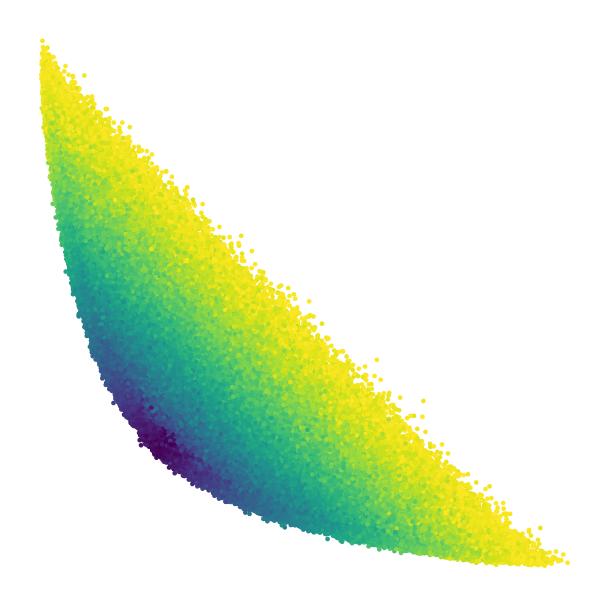

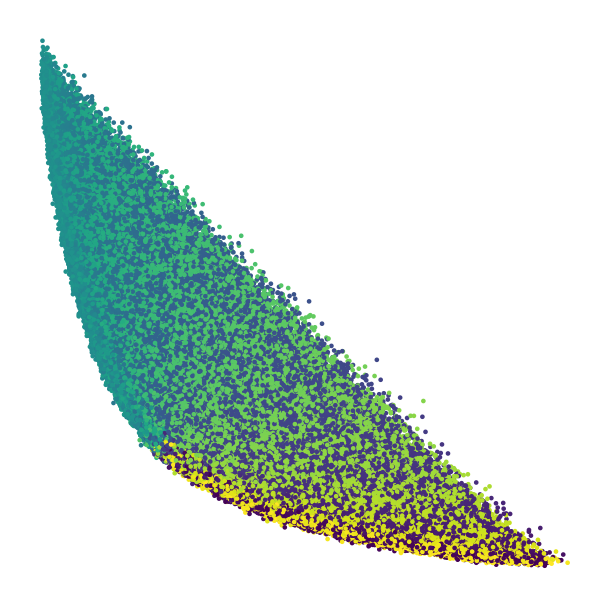

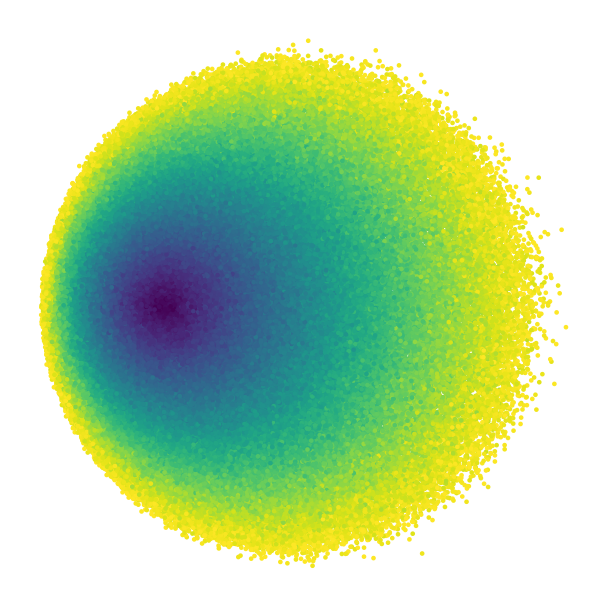

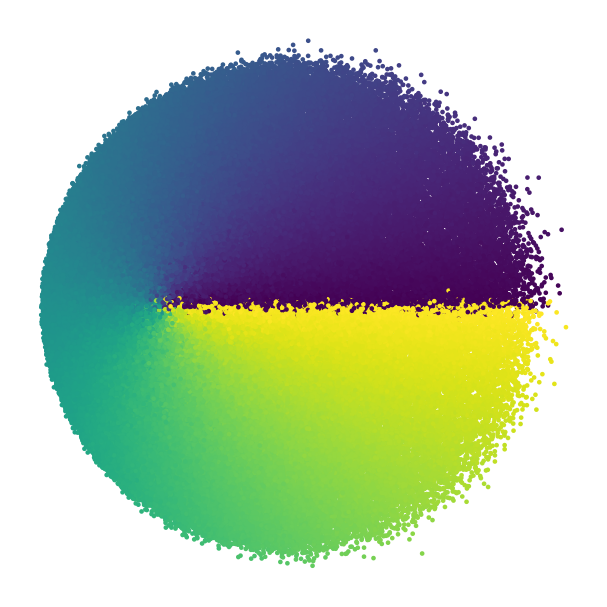

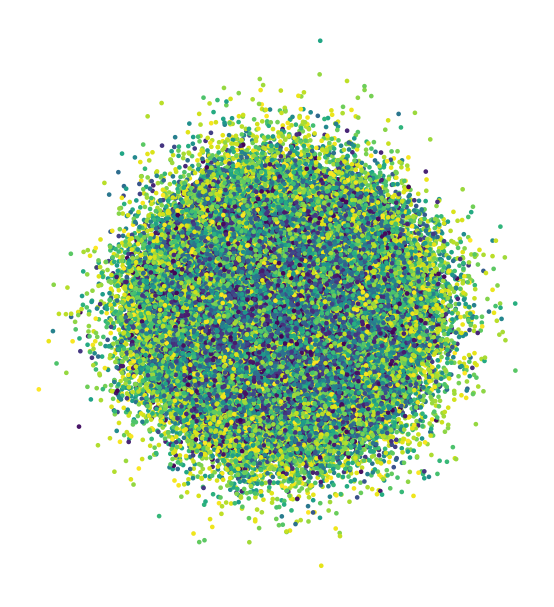

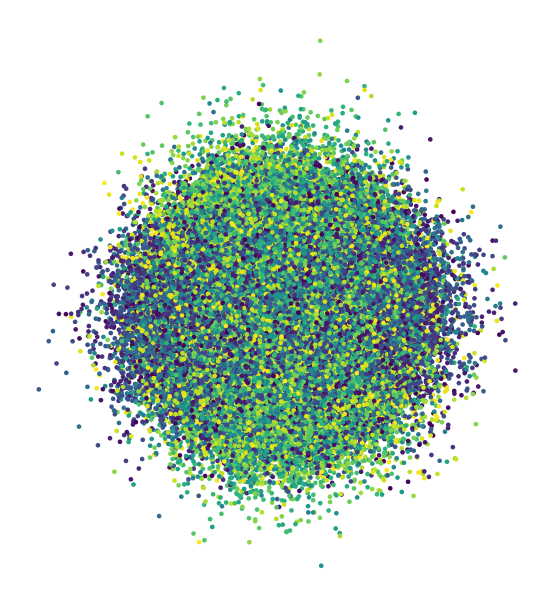

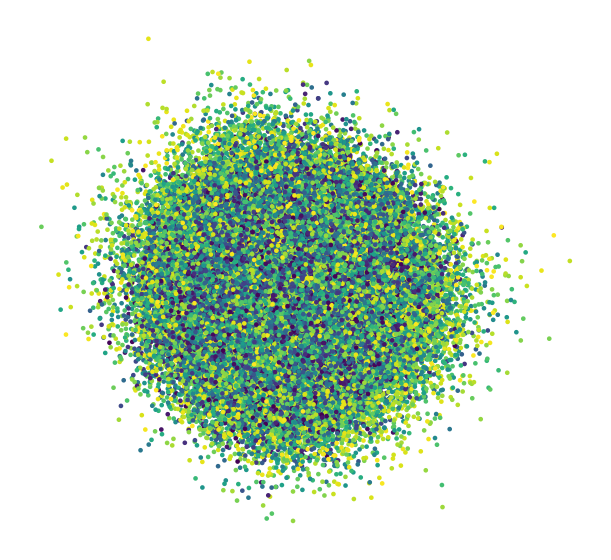

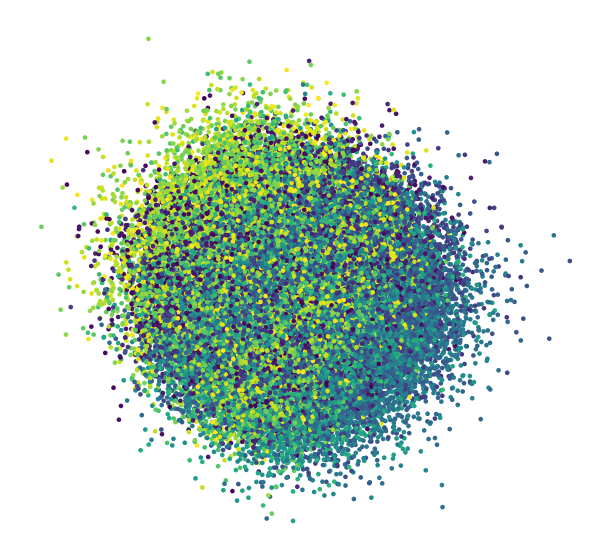

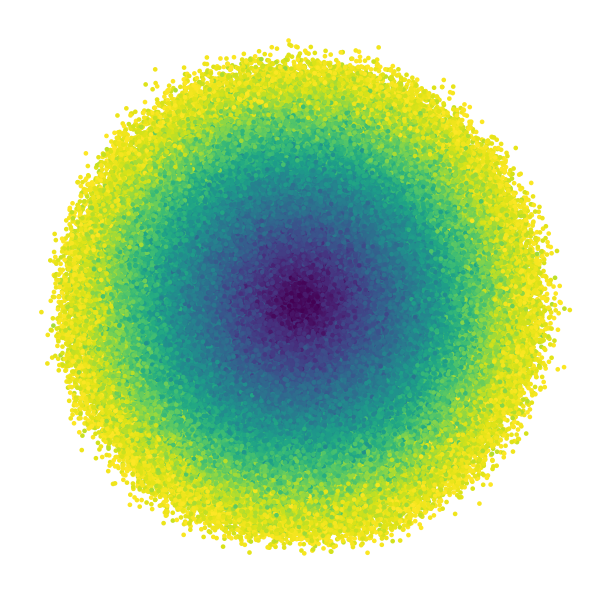

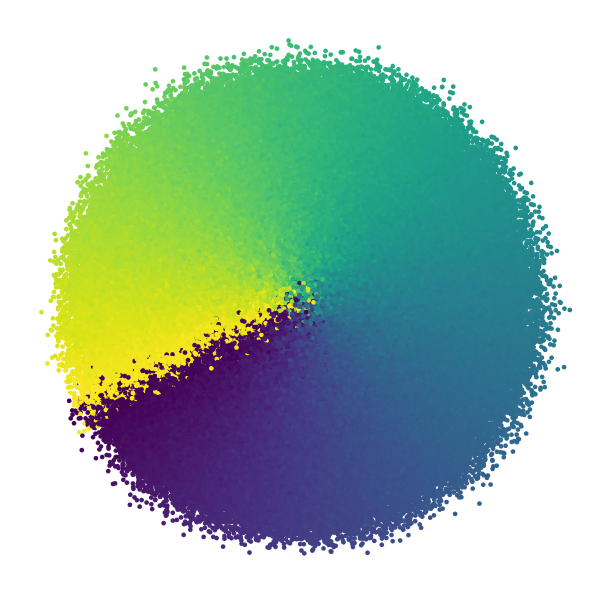

In [50]:
plot_feature_encoding(feature_var[0], "variance")
plot_feature_encoding(feature_hc[0], "handcrafted")

training_feature = f.pca(samples,2)[0]
plot_feature_encoding(training_feature, "pca")

plot_feature_encoding(feature_ae[0], "ae")
plot_feature_encoding(feature_rmi[0], "rmi")